<a href="https://colab.research.google.com/github/damiancho94/Gestion_de_Datos/blob/main/Desarrollo_Proyecto.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pandas   #biblioteca de Python utilizada para el análisis y la manipulación de datos.
!pip install numpy    # biblioteca de Python utilizada para el cálculo numérico y matemático.
!pip install pandas_profiling   # biblioteca que extiende las funcionalidades de pandas y proporciona una forma fácil de crear informes descriptivos y estadísticos de un conjunto de datos en formato DataFrame de pandas.

In [ ]:
from google.colab import drive    #Estas líneas de código se utilizan para montar el sistema de archivos de Google Drive en Google Colab.
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd   #LLamada de librerias para la ejecucion del programa 
import numpy as np  


In [ ]:

artists_mod = pd.read_csv("/content/drive/MyDrive/Gestion_de_Datos/Entrega_Proyecto/artists_mod.csv") #La función "pd.read_csv()" de la biblioteca Pandas toma como argumento la ruta del archivo CSV y devuelve un DataFrame de Pandas que contiene los datos del archivo. 
tracks_mod =  pd.read_csv("/content/drive/MyDrive/Gestion_de_Datos/Entrega_Proyecto/tracks_mod.csv")

In [ ]:

artists_mod = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Gestion de Datos /artists_mod.csv") #La función "pd.read_csv()" de la biblioteca Pandas toma como argumento la ruta del archivo CSV y devuelve un DataFrame de Pandas que contiene los datos del archivo. 
tracks_mod =  pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Gestion de Datos /tracks_mod.csv")

In [ ]:
print(tracks_mod.shape)  #La funcion "shape" devuelve una tupla que indica el número de filas y columnas que tiene el DataFrame.
print(artists_mod.shape)

(586672, 20)
(1162095, 5)


## ________________________________________________________________

## Analisis exploratorio artist_mod: 

In [ ]:
artists_mod.head(5)##Esta línea de código  la función "head()" del DataFrame "artists_mod" para mostrar las primeras 5 filas del DataFrame en la consola.

,id,followers,genres,name,popularity
0,0DheY5irMjBUeLybbCUEZ2,0.0,[],Armid & Amir Zare Pashai feat. Sara Rouzbehani,0
1,0DlhY15l3wsrnlfGio2bjU,5.0,[],ปูนา ภาวิณี,0
2,0DmRESX2JknGPQyO15yxg7,0.0,[],Sadaa,0
3,0DmhnbHjm1qw6NCYPeZNgJ,0.0,[],Tra'gruda,0
4,0Dn11fWM7vHQ3rinvWEl4E,2.0,[],Ioannis Panoutsopoulos,0


In [ ]:
artists_mod.isna().sum() #Esta funcion  devuelve la suma de valores nulos (NaN) por columna en un DataFrame llamado artists_mod. 
                        #Es decir, para cada columna en artists_mod, devuelve la cantidad de valores nulos presentes en ella. 
                        #El resultado es un índice con los nombres de las columnas en artists_mod y los valores son las sumas de los valores nulos.

id             0
followers     11
genres         0
name           0
popularity     0
dtype: int64

In [ ]:
artists_mod = artists_mod.dropna() # Quitamos los registros NA en el dataframe.

In [ ]:
artists_mod.shape  #La funcion "shape" devuelve una tupla que indica el número de filas y columnas despues de haber hecho esta limpieza.

(1162084, 5)

In [ ]:
artists_mod["id"].nunique()  #"artists_mod['id']" se utiliza para acceder a la columna "id" del DataFrame, la  función "nunique()" 
                             #se aplica a esta columna para contar el número de valores únicos que hay en ella los cuales son  1162095 artistas distintos.

1162095

In [ ]:
summary_followers = artists_mod["followers"].describe() # "artists_mod['followers']" se utiliza para acceder a la columna "followers" del DataFrame "artists_mod". 
                                                        #La función "describe()" se aplica a esta columna para calcular estadísticas descriptivas como el número de observaciones (count), la media (mean), la desviación estándar (std),
                                                        #los valores mínimo y máximo (min y max), y los percentiles 25, 50 y 75.
summary_followers

count    1.162084e+06
mean     1.022070e+04
std      2.543995e+05
min      0.000000e+00
25%      1.000000e+01
50%      5.700000e+01
75%      4.170000e+02
max      7.890023e+07
Name: followers, dtype: float64

In [ ]:
summary_popularity = artists_mod["popularity"].describe() # "artists_mod['popularity']" se utiliza para acceder a la columna "popularity" del DataFrame "artists_mod". 
                                                        #La función "describe()" se aplica a esta columna para calcular estadísticas descriptivas como el número de observaciones (count), la media (mean), la desviación estándar (std),
                                                        #los valores mínimo y máximo (min y max), y los percentiles 25, 50 y 75.
summary_popularity

count    1.162095e+06
mean     8.795961e+00
std      1.355777e+01
min      0.000000e+00
25%      0.000000e+00
50%      2.000000e+00
75%      1.300000e+01
max      1.000000e+02
Name: popularity, dtype: float64

In [ ]:
artists_mod["Artist_popularity_bin"]= pd.cut(artists_mod["popularity"],5, labels=["low","low_med", "medium","med_high", "High"])

#la línea de código crea una nueva columna en el DataFrame "artists_mod" que clasifica los valores de la columna "popularity" en cinco categorías diferentes 
#y los etiqueta con las etiquetas "low", "low_med", "medium", "med_high" y "High". Este resultado puede ser útil para analizar la distribución de los artistas en diferentes niveles de popularidad.

In [ ]:
artists_mod #Se realiza un llamado de del dataframe para visualizar como se comporta despues de añadirle una nueva columna 

,id,followers,genres,name,popularity,Artist_popularity_bin
0,0DheY5irMjBUeLybbCUEZ2,0.0,[],Armid & Amir Zare Pashai feat. Sara Rouzbehani,0,low
1,0DlhY15l3wsrnlfGio2bjU,5.0,[],ปูนา ภาวิณี,0,low
2,0DmRESX2JknGPQyO15yxg7,0.0,[],Sadaa,0,low
3,0DmhnbHjm1qw6NCYPeZNgJ,0.0,[],Tra'gruda,0,low
4,0Dn11fWM7vHQ3rinvWEl4E,2.0,[],Ioannis Panoutsopoulos,0,low
...,...,...,...,...,...,...
1162090,3cOzi726Iav1toV2LRVEjp,4831.0,['black comedy'],Ali Siddiq,34,low_med
1162091,6LogY6VMM3jgAE6fPzXeMl,46.0,[],Rodney Laney,2,low
1162092,19boQkDEIay9GaVAWkUhTa,257.0,[],Blake Wexler,10,low
1162093,5nvjpU3Y7L6Hpe54QuvDjy,2357.0,['black comedy'],Donnell Rawlings,15,low


In [ ]:
grouped_single = artists_mod.groupby('Artist_popularity_bin').agg({'popularity': ['mean', 'min', 'max',"count"]}) #agrupa los datos en el DataFrame "artists_mod" por la columna "Artist_popularity_bin" y 
                                                                                                                  #aplica cuatro funciones de agregación (media, mínimo, máximo y recuento) a la columna "popularity" del DataFrame.
                                                                                                                  #"grouped_single" es un nuevo DataFrame que muestra estas estadísticas descriptivas

grouped_single["Ratio_Populatiry"] = [(964291/1162095)*100,(145893/1162095)*100,(45166/1162095)*100,(6404/1162095)*100,(341/1162095)*100]   #calcula la proporción de artistas en cada categoría de popularidad en relación 
                                                                                                                                            #con el número total de artistas en el DataFrame. Estas proporciones se calculan 
                                                                                                                                            #como un porcentaje y se asignan a una nueva columna "Ratio_Populatiry" en el DataFrame "grouped_single".

grouped_single #Se realiza un llamado de del dataframe para visualizar como se comporta. 

popularity                  Ratio_Populatiry
                            mean min  max   count                 
Artist_popularity_bin                                             
low                     3.484229   0   20  964291        82.978672
low_med                29.060106  21   40  145893        12.554309
medium                 47.960634  41   60   45166         3.886601
med_high               66.685821  61   80    6404         0.551074
High                   85.099707  81  100     341         0.029344

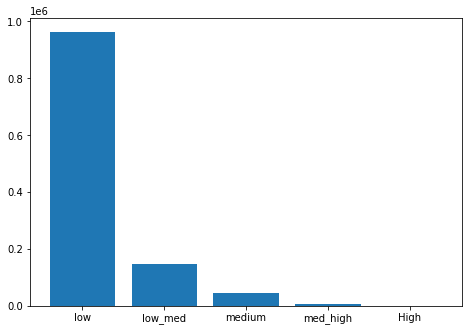

In [ ]:
import matplotlib.pyplot as plt   #Se utiliza la biblioteca Matplotlib para crear un gráfico de barras que 
                                  #muestra el recuento de artistas en cada categoría de popularidad en el DataFrame "grouped_single" generado en las líneas anteriores.
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
AA =grouped_single.popularity["count"].reset_index()
Levels =AA["Artist_popularity_bin"]
counts = AA["count"]
ax.bar(Levels,counts)
plt.show()

In [ ]:
## El 82.97% de los artistas tienen una popularidad entre 0 y 20 puntos. 
## Por otro lado los artistas que tienen popularidades entre 61 y 100 puntos, equivalen al 0.580418% del total de la poblacion en este dataframe.

## Cantidad de usuarios por genero:

In [ ]:
#La funcion cuenta la frecuencia de cada valor en la columna "genres" del DataFrame "artists_mod" y devuelve una serie que contiene la cuenta de cada valor dada la cantidad de datos nulos, que se removeran. 
artists_mod["genres"].value_counts()

[]                                                                                                                   856500
['background piano']                                                                                                    307
['calming instrumental']                                                                                                256
['background music']                                                                                                    247
['russelater']                                                                                                          226
                                                                                                                      ...  
['christian hip hop', 'christian pop', 'christian trap', 'miami hip hop', 'rap cristiano']                                1
['edm', 'moldovan pop', 'pop dance', 'progressive house', 'progressive trance', 'trance', 'uplifting trance']             1
['comic'

In [ ]:
artists_mod_gr = artists_mod.loc[artists_mod["genres"]!="[]"] #La funcion filtra el DataFrame "artists_mod" para incluir solo las filas en las que la columna "genres" que no este vacía.

In [ ]:
artists_mod_gr #Se realiza un llamado de del dataframe para visualizar como se comporta.

,id,followers,genres,name,popularity
45,0VLMVnVbJyJ4oyZs2L3Yl2,71.0,['carnaval cadiz'],Las Viudas De Los Bisabuelos,6
46,0dt23bs4w8zx154C5xdVyl,63.0,['carnaval cadiz'],Los De Capuchinos,5
47,0pGhoB99qpEJEsBQxgaskQ,64.0,['carnaval cadiz'],Los “Pofesionales”,7
48,3HDrX2OtSuXLW5dLR85uN3,53.0,['carnaval cadiz'],Los Que No Paran De Rajar,6
136,22mLrN5fkppmuUPsHx6i2G,59.0,"['classical harp', 'harp']",Vera Dulova,3
...,...,...,...,...,...
1162087,0vZbvoyHDSwTGY4v1oUo31,1682.0,"['clean comedy', 'deep comedy', 'new comedy']",Josh Sneed,20
1162088,3V4ODgUObsEHFX6GQUy8xl,419.0,['deep comedy'],Matt McCarthy,9
1162090,3cOzi726Iav1toV2LRVEjp,4831.0,['black comedy'],Ali Siddiq,34
1162093,5nvjpU3Y7L6Hpe54QuvDjy,2357.0,['black comedy'],Donnell Rawlings,15


In [ ]:
Artist_genres =artists_mod_gr["genres"].value_counts().reset_index() #La diferencia con la línea de código anterior "artists_mod["genres"].value_counts()" es que ahora se está trabajando en el 
                                                                     #DataFrame "artists_mod_gr" que previamente se había filtrado para eliminar las filas en las que la columna "genres" que estaba vacía. 
                                                                     #De esta forma, se obtiene la cuenta de géneros musicales solo para los artistas que tienen valores en la columna "genres".
Artist_genres

,index,genres
0,['background piano'],307
1,['calming instrumental'],256
2,['background music'],247
3,['russelater'],226
4,['barnmusik'],225
...,...,...
49149,"['christian hip hop', 'christian pop', 'christ...",1
49150,"['edm', 'moldovan pop', 'pop dance', 'progress...",1
49151,"['comic', 'modern ska punk', 'punk', 'ska', 's...",1
49152,"['dirty south rap', 'g funk', 'gangster rap', ...",1


In [ ]:
Artist_genres["Quantity_Genres"]= pd.cut(Artist_genres["genres"],9, labels=["Nv_1","Nv_2","Nv_3","Nv_4","Nv_5","Nv_6","Nv_7","Nv_8","Nv_9"])

#En esta funcion se  divide los valores de la columna "genres" del DataFrame "Artist_genres" en nueve intervalos iguales utilizando la función "cut()" de Pandas.
#Con la funcion "cut()" clasificamos los valores en una columna en intervalos de tamaño fijo. Dicidimos "genres"  en nueve intervalos iguales. 
#Se crea una nueva columna "Quantity_Genres" en el DataFrame "Artist_genres" que contiene las etiquetas correspondientes a cada intervalo de la columna "genres". 
#En resumen, esta línea de código crea una nueva columna en el DataFrame "Artist_genres" que clasifica los géneros musicales según la cantidad de artistas que los interpretan en nueve niveles diferentes.

In [ ]:
Artist_genres  #Se realiza un llamado de del dataframe para visualizar como se comporta. 

,index,genres,Quantity_Genres
0,['background piano'],307,Nv_9
1,['calming instrumental'],256,Nv_8
2,['background music'],247,Nv_8
3,['russelater'],226,Nv_7
4,['barnmusik'],225,Nv_7
...,...,...,...
49149,"['christian hip hop', 'christian pop', 'christ...",1,Nv_1
49150,"['edm', 'moldovan pop', 'pop dance', 'progress...",1,Nv_1
49151,"['comic', 'modern ska punk', 'punk', 'ska', 's...",1,Nv_1
49152,"['dirty south rap', 'g funk', 'gangster rap', ...",1,Nv_1


In [ ]:
Artist_genres["genres"].sum() #uLa funcion que representa una columna numérica que muetsra la cantidad de artistas por género musical. 

305590

In [ ]:
Grouped_genres = Artist_genres.groupby('Quantity_Genres').agg({'genres': ['mean',"min","max","count"]})
Grouped_genres["Ratio_genres"] = [(140040/305595)*100,(80177/305595)*100,(50386/305595)*100,(24362/305595)*100
                                  ,(6239/305595)*100,(3130/305595)*100,(451/305595)*100,(503/305595)*100,(307/305595)*100]
Grouped_genres

#En esta funcion agrupamos los datos del DataFrame "Artist_genres" por los niveles de "Quantity_Genres", que en otras palabras es un conteo del total de artistas por genero.  
#La función "agg()" es utilizada para aplicar diferentes funciones estadísticas a la columna "genres" para cada nivel de "Quantity_Genres". 
#Las funciones aplicadas son: "mean", que calcula la media; "min" y "max", que obtienen el valor mínimo y máximo, respectivamente; y "count", 
#que cuenta el número de valores no nulos en la columna "genres" para cada nivel de "Quantity_Genres".
#Después de agrupar y aplicar las funciones estadísticas, se agrega una nueva columna llamada "Ratio_genres" a "Grouped_genres", 
#la cual contiene la proporción de artistas que interpretan cada nivel de género musical en relación al total de artistas en el DataFrame "Artist_genres". 

## 45,85% de generos tienen entre 1 y 35 artistas


genres                  Ratio_genres
                       mean  min  max  count             
Quantity_Genres                                          
Nv_1               3.002187    1   35  46646    45.825357
Nv_2              48.825822   36   69   1642    26.236359
Nv_3              84.824916   70  103    594    16.487835
Nv_4             116.564593  104  137    209     7.971989
Nv_5             152.170732  138  170     41     2.041591
Nv_6             184.117647  175  204     17     1.024231
Nv_7             225.500000  225  226      2     0.147581
Nv_8             251.500000  247  256      2     0.164597
Nv_9             307.000000  307  307      1     0.100460

In [ ]:
# Hay 46646 generos que agrupan entre 1 y 35 artistas, y un solo genero agrupa 307 artistas.

## Followers:

In [ ]:
artists_mod["followers"]=artists_mod.followers.round(10)
artists_mod["Artist_followers_bin"]= pd.cut(artists_mod["followers"],
       5, labels=["low","low_med", "medium","med_high", "High"])
artists_mod["followers"]=artists_mod.followers.round(10)

#En esta funcion , se está creando una nueva columna en el DataFrame artists_mod llamada Artist_followers_bin. 
#Para crear esta columna se está dividiendo la columna followers en 5 segmentos utilizando la función cut() de Pandas. 
#Los límites para cada segmento se calcularán automáticamente basándose en el rango de valores de la columna followers. 
#Luego, se le asignan etiquetas a cada segmento para indicar el nivel de popularidad del artista. 
#Estas etiquetas son: "low" (bajo), "low_med" (medio-bajo), "medium" (medio), "med_high" (medio-alto) y "High" (alto). 
#Además, se está redondeando la columna followers a 10 decimales utilizando el método round() de Pandas.

In [ ]:

grouped_follow = artists_mod.groupby('Artist_followers_bin').agg({'followers': ['mean', 'min', 'max',"count"]})
grouped_follow

#En esta funcion  se agrupa por columna  artists_mod y Artist_followers_bin 
#Las estadísticas de resumen incluyen la media, el mínimo, el máximo, el recuento y la suma. 
#Estas estadísticos se calcularán por cada uno de los grupos definidos por los valores únicos de la columna Artist_followers_bin. 
#El resultado es un nuevo DataFrame llamado grouped_follow con las estadísticas de resumen calculadas para cada grupo.

followers                                 
                              mean         min         max    count
Artist_followers_bin                                               
low                   8.855069e+03         0.0  15762250.0  1162025
low_med               2.191159e+07  15797256.0  31308207.0       45
medium                3.698775e+07  31623813.0  44606973.0       11
med_high              5.785891e+07  54416812.0  61301006.0        2
High                  7.890023e+07  78900234.0  78900234.0        1

In [ ]:
# 1162025 artistas cuentan entre 0 y 15762250.0 seguidores 
# solo 3 artistas cuentan entre 57858910 y 78900234.0 de seguidores.

In [ ]:
from ydata_profiling import ProfileReport #En esta línea de código, se está importando la función ProfileReport del paquete pandas_profiling. 
profile = ProfileReport(artists_mod) #Luego, se está creando un informe de perfil de pandas llamando a ProfileReport() y pasando como argumento el DataFrame artists_mod.
profile.to_notebook_iframe() #La función ProfileReport() genera un informe detallado con estadísticas y visualizaciones sobre el DataFrame,
     # que incluyen información sobre variables categóricas, variables numéricas, correlaciones, valores perdidos y otros datos relevantes. 

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


In [ ]:
## Por ultimo apoyandonos en el informe de pandasprofiling, tenemos que el indice de correlacion entre followers y popularity es mediano y positivo. 
## Por lo que se sugiere que el hecho de que un artista tenga mas seguidores puede ayudar a que tenga una popularidad mas alta.


## Exploratoria Tracks songs:


In [ ]:
tracks_mod.head(6) #Esta línea de código  la función "head()" del DataFrame "tracks_mod" para mostrar las primeras 6 filas del DataFrame en la consola.

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6.0,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.445,0.0,-13.338,1.0,0.4510,0.674,0.7440,0.1510,0.1270,104.851,3.0
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0.0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.263,0.0,-22.136,1.0,0.9570,0.797,0.0000,0.1480,0.6550,102.009,1.0
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0.0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.177,1.0,-21.180,1.0,0.0512,0.994,0.0218,0.2120,0.4570,130.418,5.0
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,NaN,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,NaN,7.0,-27.961,1.0,0.0504,0.995,0.9180,0.1040,0.3970,169.980,3.0
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0.0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.158,3.0,-16.900,0.0,0.0390,0.989,0.1300,0.3110,0.1960,103.220,4.0
5,0BRXJHRNGQ3W4v9frnSfhu,Ave Maria,0.0,178933,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.227,0.261,5.0,-12.343,1.0,0.0382,0.994,0.2470,0.0977,0.0539,118.891,4.0


In [ ]:
tracks_mod.shape #La funcion "shape" devuelve una tupla que indica el número de filas y columnas que tiene el DataFrame. 

(586672, 20)

In [ ]:
tracks_mod.isna().sum() #Esta funcion  devuelve la suma de valores nulos (NaN) por columna en un DataFrame llamado tracks_mod. 
                        #Es decir, para cada columna en tracks_mod, devuelve la cantidad de valores nulos presentes en ella. 
                        #El resultado es un índice con los nombres de las columnas en tracks_mod y los valores son las sumas de los valores nulos.

id                      0
name                   71
popularity          31544
duration_ms             0
explicit                0
artists                 0
id_artists              0
release_date            0
danceability        22195
energy              22426
key                 22558
loudness            22434
mode                22266
speechiness         22456
acousticness        22617
instrumentalness    22470
liveness            22278
valence             22348
tempo               22354
time_signature      22350
dtype: int64

In [ ]:
tracks_mod.info()  # A continuacion se  muestra información detallada sobre el Dataframe tracks_mod.
                   # Además, muestra la cantidad de valores no nulos presentes en cada columna y la cantidad de memoria que ocupa el DataFrame en el sistema.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 586672 entries, 0 to 586671
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id                586672 non-null  object 
 1   name              586601 non-null  object 
 2   popularity        555128 non-null  float64
 3   duration_ms       586672 non-null  int64  
 4   explicit          586672 non-null  int64  
 5   artists           586672 non-null  object 
 6   id_artists        586672 non-null  object 
 7   release_date      586672 non-null  object 
 8   danceability      564477 non-null  float64
 9   energy            564246 non-null  float64
 10  key               564114 non-null  float64
 11  loudness          564238 non-null  float64
 12  mode              564406 non-null  float64
 13  speechiness       564216 non-null  float64
 14  acousticness      564055 non-null  float64
 15  instrumentalness  564202 non-null  float64
 16  liveness          56

In [ ]:
tracks_mod = tracks_mod.dropna() #La línea tracks_mod = tracks_mod.dropna() elimina todas las filas que contienen valores nulos (NaN) del DataFrame tracks_mod 
                                 #y asigna el nuevo DataFrame resultante sin filas nulas de nuevo a la misma variable tracks_mod, para trabajar con datos completos y rellenarlos y imputarlos con valor ajenos. 
tracks_mod

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6.0,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.445,0.0,-13.338,1.0,0.4510,0.674,0.744000,0.1510,0.1270,104.851,3.0
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0.0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.263,0.0,-22.136,1.0,0.9570,0.797,0.000000,0.1480,0.6550,102.009,1.0
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0.0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.177,1.0,-21.180,1.0,0.0512,0.994,0.021800,0.2120,0.4570,130.418,5.0
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0.0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.158,3.0,-16.900,0.0,0.0390,0.989,0.130000,0.3110,0.1960,103.220,4.0
5,0BRXJHRNGQ3W4v9frnSfhu,Ave Maria,0.0,178933,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.227,0.261,5.0,-12.343,1.0,0.0382,0.994,0.247000,0.0977,0.0539,118.891,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
586663,4ow9HehIdFii1cggylW2k0,四季予你 - DJ版,47.0,156393,0,"['程響', '阿卓']","['7nKA1c1Qn6nI0XA8yburf3', '7g8hOWXtGS16J30CMU...",2020-12-29,0.677,0.970,0.0,-3.388,0.0,0.0446,0.134,0.002340,0.3020,0.9080,140.026,4.0
586664,1Kzjk1EyngBcP4T8x3fyqv,同行 (新加坡電視劇《愛...沒有距離》主題曲),43.0,205238,0,['Boon Hui Lu'],['6PWJWwEm8BSBFAIAUWlwe4'],Year 2020,0.743,0.679,8.0,-3.952,1.0,0.0323,0.269,0.000000,0.1330,0.3950,126.070,4.0
586667,5rgu12WBIHQtvej2MdHSH0,云与海,50.0,258267,0,['阿YueYue'],['1QLBXKM5GCpyQQSVMNZqrZ'],2020-09-26,0.560,0.518,0.0,-7.471,0.0,0.0292,0.785,0.000000,0.0648,0.2110,131.896,4.0
586668,0NuWgxEp51CutD2pJoF4OM,blind,72.0,153293,0,['ROLE MODEL'],['1dy5WNgIKQU6ezkpZs4y8z'],2020-10-21,0.765,0.663,0.0,-5.223,1.0,0.0652,0.141,0.000297,0.0924,0.6860,150.091,4.0


In [ ]:
tracks_mod.isna().sum() #Se realiza un nuevo llamado de la funcion para verificar que ya el nuevo Data frame no cuenta con valores Nulos. 

id                  0
name                0
popularity          0
duration_ms         0
explicit            0
artists             0
id_artists          0
release_date        0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
dtype: int64

In [ ]:
tracks_mod.popularity.max() #La línea tracks_mod.popularity.max() devuelve el valor máximo de la columna 'popularity' en el DataFrame 'tracks_mod'. 
                            #En otras palabras, devuelve el valor más alto de popularidad entre todas las canciones en el conjunto de datos 'tracks_mod'.

100.0

In [ ]:

tracks_mod["Popularity_Song_bins"]= pd.cut(tracks_mod["popularity"],9, labels=["Nv_0_11","Nv_12_22","Nv_23_33","Nv_34_44","Nv_45_55","Nv_56_66","Nv_67_77","Nv_78_88","Nv_89_100"])

#En esta línea se está creando una nueva columna en el DataFrame tracks_mod llamada "Popularity_Song_bins", que categoriza la popularidad de las canciones en 9 niveles diferentes, 
#especificados mediante los límites del rango de popularidad y etiquetas de las categorías. Los límites y etiquetas se pasan como argumentos a la función pd.cut().
#La popularidad de cada canción se toma de la columna "popularity" del DataFrame tracks_mod.

In [ ]:
grouped_songs = tracks_mod.groupby('Popularity_Song_bins').agg({'popularity': ['mean', 'min', 'max',"count"]})

#En esta línea se agrupa el dataframe "tracks_mod" por los valores de "Popularity_Song_bins" y se aplican diversas funciones a la columna "popularity" del dataframe agrupado, 
#incluyendo la media, el mínimo, el máximo y el recuento de elementos en cada grupo. Luego, el resultado se asigna a la variable "grouped_songs".

grouped_songs


popularity                    
                           mean   min    max  count
Popularity_Song_bins                               
Nv_0_11                3.879574   0.0   11.0  81677
Nv_12_22              17.298387  12.0   22.0  61809
Nv_23_33              27.918483  23.0   33.0  71470
Nv_34_44              38.655435  34.0   44.0  66864
Nv_45_55              49.478551  45.0   55.0  40702
Nv_56_66              60.129355  56.0   66.0  18801
Nv_67_77              70.811749  67.0   77.0   5822
Nv_78_88              80.944570  78.0   88.0    884
Nv_89_100             91.216216  89.0  100.0     37

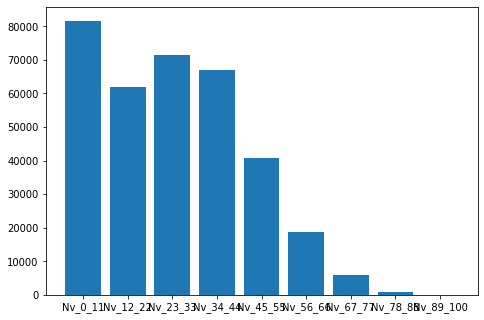

In [ ]:
import matplotlib.pyplot as plt  #Se utiliza la biblioteca Matplotlib para crear un gráfico de barras que 
                                  #muestra el recuento de artistas en cada categoría de popularidad en el DataFrame "grouped_songs" generado en las líneas anterior.
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
AA =grouped_songs.popularity["count"].reset_index()
Levels =AA["Popularity_Song_bins"]
counts = AA["count"]
ax.bar(Levels,counts)
plt.show()

In [ ]:
pias=tracks_mod.groupby(['artists',"name"]).agg({'popularity': ['mean',"min","max","count"]})
pias.sort_values([('popularity', 'count')], ascending=False).head(10)

#En estas líneas, se está creando un grupo de canciones (tracks) por artista y por nombre de la canción  utilizando el método groupby de pandas.
# Luego calculamos algunas estadísticas de popularidad de las canciones en cada grupo. Específicamente, se está calculando la media, el mínimo, el máximo y la cuenta de la popularidad de cada canción en el grupo.
#Por ultimose ordenan los resultados por la cuenta de popularidad en orden descendente (sort_values) y se está mostrando las 10 canciones con la cuenta de popularidad más alta.





popularity        \
                                                                 mean   min   
artists                       name                                            
['Busted']                    Year 3000                      7.787879   0.0   
['Justin Bieber']             Hold On                       12.633333   0.0   
['J Balvin']                  Azul                           7.000000   0.0   
['Daddy Yankee']              Que Tire Pa Lante              5.230769   0.0   
['J Balvin', 'Zion & Lennox'] No Es Justo                    8.320000   0.0   
['Justin Bieber']             Anyone                        10.640000   0.0   
['J Balvin']                  Morado                         4.041667   0.0   
['Years & Years']             King                          11.636364   0.0   
['Bibi Blocksberg']           Bibi Blocksberg Lied          31.666667  27.0   
['Trasko', 'Robert Fulton']   New Years Day - Original Mix   0.200000   0.0   

                                                                        
                                                             max count  
artists                       name                                      
['Busted']                    Year 3000                     65.0    33  
['Justin Bieber']             Hold On                       88.0    30  
['J Balvin']                  Azul                          81.0    27  
['Daddy Yankee']              Que Tire Pa Lante             76.0    26  
['J Balvin', 'Zion & Lennox'] No Es Justo                   69.0    25  
['Justin Bieber']             Anyone                        90.0    25  
['J Balvin']                  Morado                        21.0    24  
['Years & Years']             King                          70.0    22  
['Bibi Blocksberg']           Bibi Blocksberg Lied          39.0    21  
['Trasko', 'Robert Fulton']   New Years Day - Original Mix   3.0    20

In [ ]:
tracks_mod.columns #En esta funcion se devuelve una lista con los nombres de las columnas del DataFrame tracks_mod.

Index(['id', 'name', 'popularity', 'duration_ms', 'explicit', 'artists',
       'id_artists', 'release_date', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature',
       'Popularity_Song_bins'],
      dtype='object')

In [ ]:
Filtroo_malas =tracks_mod.loc[tracks_mod['Popularity_Song_bins'].isin(['Nv_0_11']),['artists', 'popularity', 'explicit','danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature']]

#En esta línea se filtran las canciones con una popularidad baja (en la categoría 'Nv_0_11') del dataframe 'tracks_mod' y se seleccionan las columnas que interesan para un análisis
#Los resultados de esta operación se almacenan en un nuevo dataframe llamado 'Filtroo_malas'.



In [ ]:
Filtroo_malas.describe() 

#La función describe() se utiliza para obtener un resumen estadístico de un DataFrame. En este caso, se está aplicando la función al DataFrame Filtroo_malas que contiene 
#sólo aquellas canciones que se encuentran en el rango de popularidad más bajo (entre 0 y 11).

,popularity,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,81677.000000,81677.000000,81677.000000,81677.000000,81677.000000,81677.000000,81677.000000,81677.000000,81677.000000,81677.000000,81677.000000,81677.000000,81677.000000,81677.000000
mean,3.879574,-0.005424,0.524356,0.422277,5.156176,-12.382302,0.676004,0.115654,0.657527,0.237817,0.220746,0.533477,115.206878,3.812873
std,3.808194,0.163321,0.168713,0.258205,3.481046,5.603778,0.468001,0.200582,0.356232,0.357109,0.180206,0.267589,30.232459,0.571988
min,0.000000,-1.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.408000,0.215000,2.000000,-15.602000,0.000000,0.036500,0.377000,0.000002,0.105000,0.317000,91.966000,4.000000
50%,3.000000,0.000000,0.535000,0.375000,5.000000,-11.613000,1.000000,0.047100,0.814000,0.001660,0.148000,0.549000,114.395000,4.000000
75%,7.000000,0.000000,0.651000,0.605000,8.000000,-8.254000,1.000000,0.079600,0.965000,0.518000,0.287000,0.759000,133.125000,4.000000
max,11.000000,1.000000,0.987000,1.000000,11.000000,5.376000,1.000000,0.971000,0.996000,0.999000,0.996000,1.000000,239.906000,5.000000


In [ ]:
Filtroo_buenas =tracks_mod.loc[tracks_mod['Popularity_Song_bins'].isin(['Nv_89_100']),['artists', 'popularity', 'explicit','danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature']]

#En esta línea se filtran las canciones con una popularidad alta (en la categoría 'Nv_89_100') del dataframe 'tracks_mod' y se seleccionan las columnas que interesan para un análisis
#Los resultados de esta operación se almacenan en un nuevo dataframe llamado 'Filtroo_buenas'.

In [ ]:
Filtroo_buenas.describe()

#La función describe() se utiliza para obtener un resumen estadístico de un DataFrame. En este caso, se está aplicando la función al DataFrame Filtroo_buenas que contiene 
#sólo aquellas canciones que se encuentran en el rango de popularidad más alto (entre 89 y 100).

,popularity,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000
mean,91.216216,0.351351,0.700405,0.607730,4.837838,-6.716838,0.567568,0.105062,0.269305,0.004798,0.157268,0.492738,119.977432,3.972973
std,2.473584,0.538321,0.133001,0.161117,3.738044,2.107331,0.502247,0.087262,0.268817,0.021608,0.127119,0.239577,28.279438,0.164399
min,89.000000,-1.000000,0.351000,0.296000,0.000000,-12.603000,0.000000,0.027000,0.001200,0.000000,0.046100,0.082300,71.884000,3.000000
25%,90.000000,0.000000,0.653000,0.511000,1.000000,-7.773000,0.000000,0.044100,0.044100,0.000000,0.090600,0.347000,99.048000,4.000000
50%,91.000000,0.000000,0.722000,0.610000,5.000000,-6.476000,1.000000,0.060100,0.194000,0.000000,0.112000,0.467000,115.884000,4.000000
75%,92.000000,1.000000,0.798000,0.730000,8.000000,-5.483000,1.000000,0.135000,0.401000,0.000095,0.190000,0.716000,136.006000,4.000000
max,100.000000,1.000000,0.935000,0.908000,11.000000,-3.255000,1.000000,0.375000,0.934000,0.130000,0.696000,0.915000,181.088000,4.000000


In [ ]:
#!pip install ydata_profiling
from ydata_profiling import ProfileReport

profile = ProfileReport(Filtroo_buenas)
profile.to_notebook_iframe()  #subir 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 344.5/344.5 KB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 43.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 KB 11.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 KB 43.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 49.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 KB 5.8 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=e31ad1351f394b53db44bd7925dcd17f037154a364d7d6d63fdae8ffa5d8e8db
  Stored in directory: /root/.cache/pip/wheels/23/14/6e/4be5bfeeb027f4939a01764b48edd5996acf574b0913fe5243
Successfully built htmlmin
  Attempting uninstall: typeguard
    Found existing installation: typeguard 2.7.1
    Unin

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:

profile = ProfileReport(Filtroo_malas)
profile.to_notebook_iframe()  #Canciones "Malas"

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

***Conclusiones ***

1. La limpieza y preprocesamiento de los datos son esenciales para garantizar que los resultados sean precisos y confiables. Es importante verificar la calidad y coherencia de los datos antes de utilizarlos en un análisis.

---



2. La elección adecuada de las herramientas y técnicas de análisis de datos es fundamental para obtener información valiosa. Dependiendo de los objetivos del análisis, se pueden utilizar diferentes métodos estadísticos, de visualización, 
de aprendizaje automático, entre otros.

---

3. Los resultados del análisis deben ser presentados de manera clara y accesible para que los usuarios puedan comprender fácilmente la información y tomar decisiones informadas en base a ella.

---



4. El análisis de datos puede ser útil para identificar patrones y tendencias, así como para descubrir nuevas oportunidades o problemas en un conjunto de datos. Sin embargo, también tiene limitaciones y es importante tener en cuenta el contexto en el que se recopilaron los datos y las limitaciones del análisis en sí mismo.

---



5. En general, el análisis de datos puede ser una herramienta valiosa para tomar decisiones informadas y optimizar el rendimiento de nuestros datos. 

---


